# Widzenie komputerowe - projekt 1
## Temat: Creating a clean plate (Usuwanie ludzi z obrazu)
Autorzy:
- Michał Ciesielski 145325
- Mateusz Frąckowiak 145264
- Paweł Chumski 144392

In [ ]:
# import niezbędnych bibliotek
import cv2
import matplotlib.pyplot as plt
import numpy as np
import PIL
from IPython.display import display
from copy import deepcopy

In [ ]:
# pobranie zestawu zdjęć wraz z oczekiwanym rezultatem
!wget -O cathedral.zip http://grail.cs.washington.edu/projects/photomontage/data/cathedral.zip && unzip -o cathedral.zip

--2023-04-15 09:47:50--  http://grail.cs.washington.edu/projects/photomontage/data/cathedral.zip
Resolving grail.cs.washington.edu (grail.cs.washington.edu)... 128.208.5.93, 2607:4000:200:14::5d
Connecting to grail.cs.washington.edu (grail.cs.washington.edu)|128.208.5.93|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1342082 (1.3M) [application/zip]
Saving to: ‘cathedral.zip’

cathedral.zip       100%[===================>]   1.28M  4.97MB/s    in 0.3s    

2023-04-15 09:47:51 (4.97 MB/s) - ‘cathedral.zip’ saved [1342082/1342082]

Archive:  cathedral.zip
  inflating: cathedral/d001.jpg      
  inflating: cathedral/d002.jpg      
  inflating: cathedral/d003.jpg      
  inflating: cathedral/d004.jpg      
  inflating: cathedral/d005.jpg      
  inflating: cathedral/result.png    


## Funkcje pomocnicze

In [1]:
if 'google.colab' in str(get_ipython()):
  from google.colab.patches import cv2_imshow
  imshow = cv2_imshow
else:
  def imshow(a):
    a = a.clip(0, 255).astype('uint8')
    if a.ndim == 3:
      if a.shape[2] == 4:
        a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
      else:
        a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    display(PIL.Image.fromarray(a))

In [2]:
def h_color(a, interpolation=None, size=None, fy=1.5, fx=1.5, cmap='gray'):
  s = [int(a.shape[0] * fy), int(a.shape[1] * fx)] if size is None else size
  plt.figure(figsize=s)
  plt.tick_params(
    axis='both', which='both',
    bottom=False, top=False,
    labelbottom=False, labelleft=False, left=False, right=False
  )
  plt.imshow(a, cmap=cmap, interpolation=interpolation)

In [3]:
css = """
<style type="text/css">
  table, td, table.dataframe, table.dataframe td { 
    border: 1px solid black;    //border: double;
    border-collapse: collapse;
    border-style: solid;
    border-spacing: 0px;
    background-color: rgb(250,250,250);
    width: 24px;
    height: 24px;
    text-align: center;
    transform: scale(1.0);
    margin: 5px;
    }
</style>
"""

def h(s):
   return display(HTML(css + DataFrame(s).to_html(header=False, index=False)))

In [4]:
def h_color_3d(z):
  fig = go.Figure(data=[go.Surface(z=z)])
  fig.update_layout(autosize=False, width=500, height=500)
  fig.show()

## Wczytanie obrazów

(5, 500, 752, 3)
Zdjecia katedry z roznymi ludzmi na 1 planie


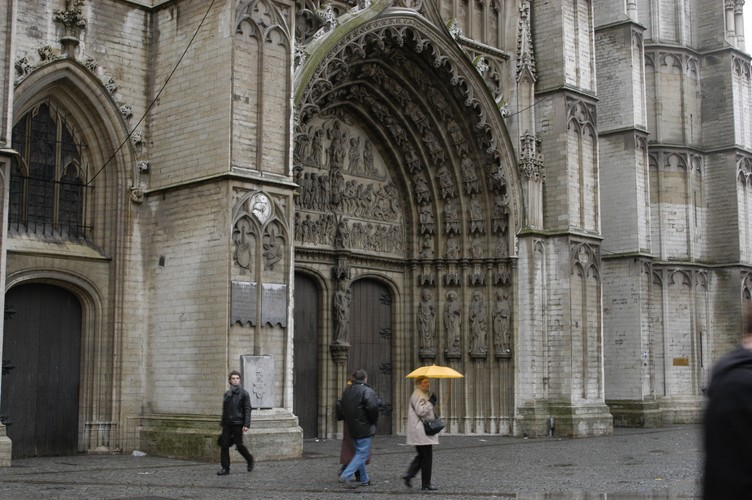

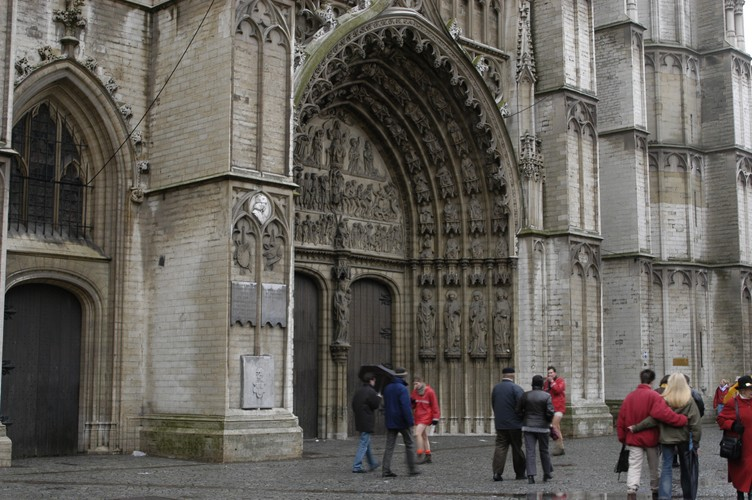

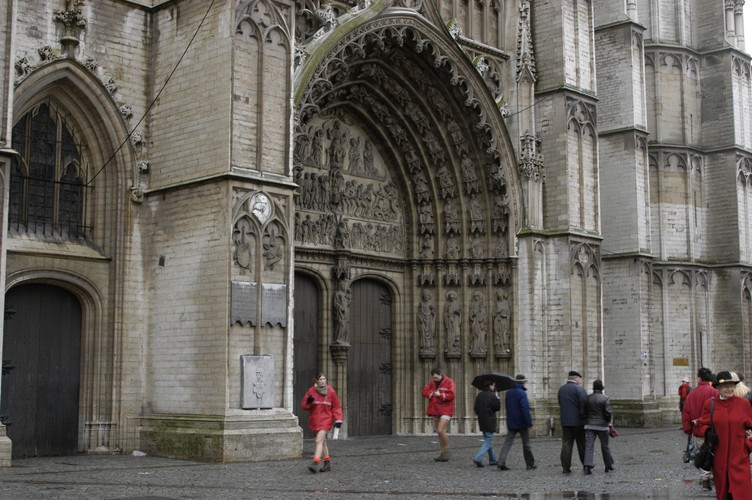

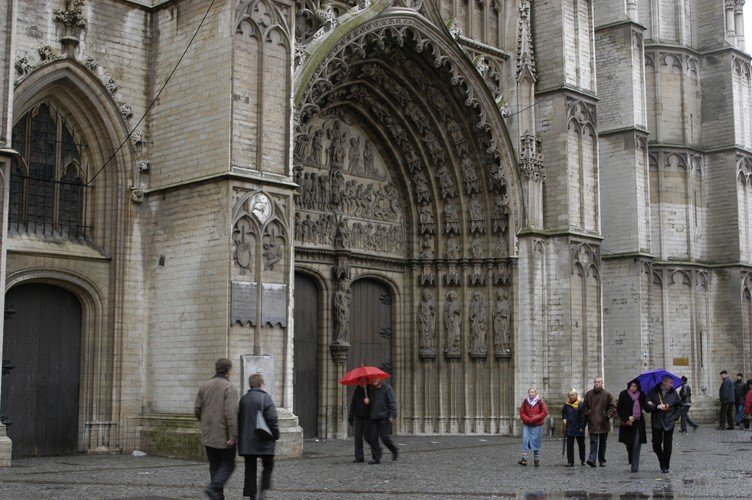

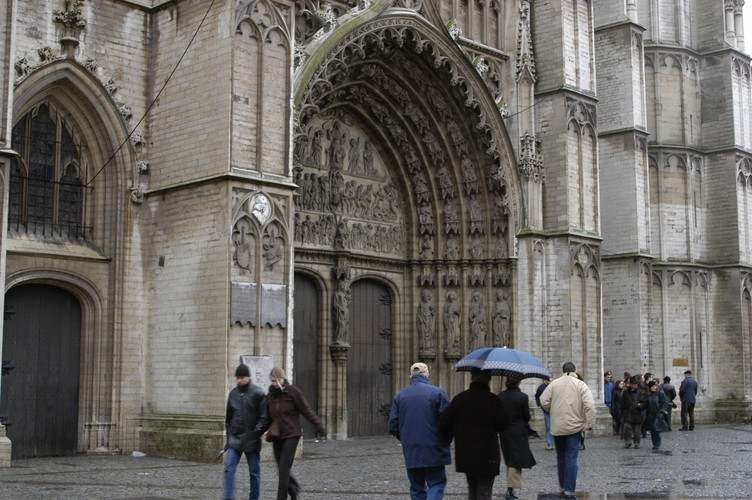

Oczekiwany rezultat


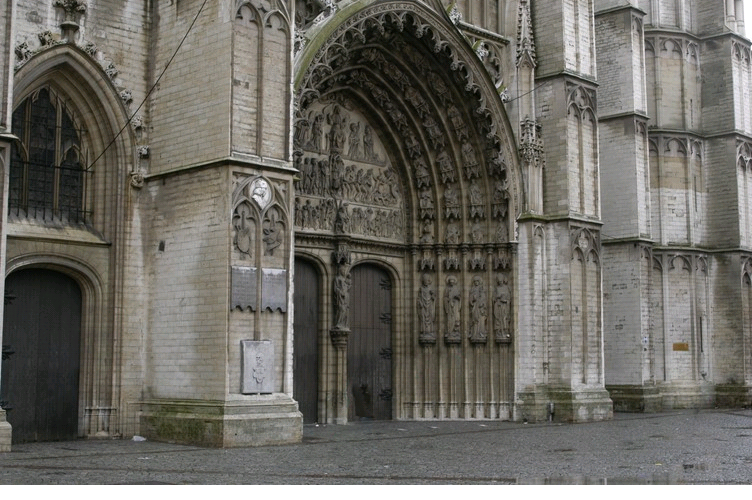

In [ ]:
files = [
    './cathedral/d001.jpg',
    './cathedral/d002.jpg',
    './cathedral/d003.jpg',
    './cathedral/d004.jpg',
    './cathedral/d005.jpg',
]

# wczytanie danych
cathedral_imgs = [cv2.imread(f, 1) for f in files]
cathedral_imgs = np.array(cathedral_imgs)
# cathedral_imgs = list(map(lambda i: cv2.resize(i, None, fx=0.5, fy=0.5), cathedral_imgs))
print(cathedral_imgs.shape)

# wczytanie spodziewanego wyniku algorytmu
result_img = cv2.imread('./cathedral/result.png', 1)
# result_img = cv2.resize(result_img, None, fx=0.7, fy=0.7)

print('Zdjecia katedry z roznymi ludzmi na 1 planie')
for cathedral_img in cathedral_imgs:
  imshow(cathedral_img)

print('Oczekiwany rezultat')
imshow(result_img)

# Pierwsze, proste próby
We wstępnym przetwarzaniu, w najbardziej intuicyjny sposób, wykorzystaliśmy filtry medianowy i wartości średniej na sekwencji zdjęć wejściowych. Wyniki przetwarzania są widoczne poniżej i posłużyły nam jako punkt odniesienia do wyników bardziej zaawansowanego przetwarzania.

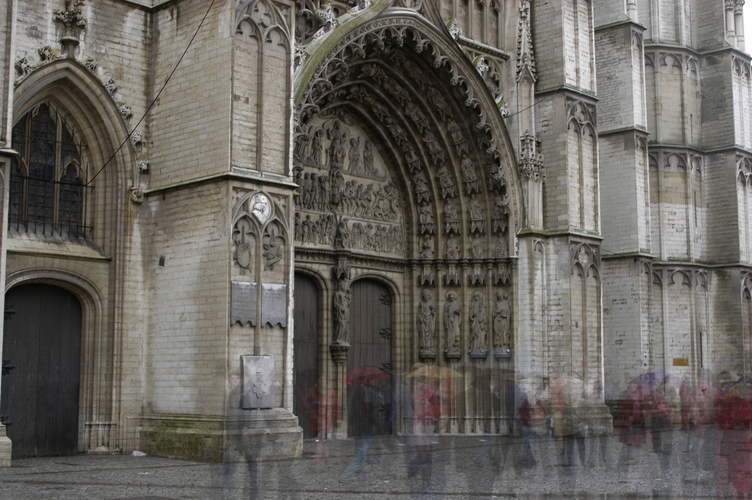

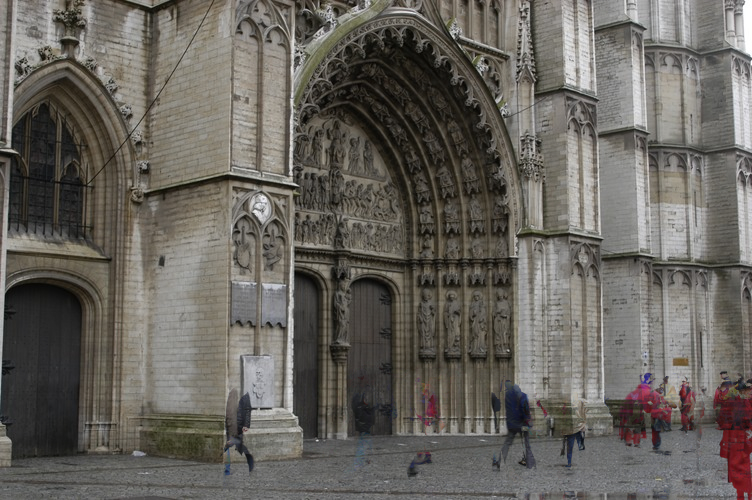

In [ ]:
sequence = np.stack((cathedral_imgs[0], cathedral_imgs[1], cathedral_imgs[2], cathedral_imgs[3], cathedral_imgs[4]), axis=-1)
result = np.median(sequence, axis=-1).astype(np.uint8)
result2 = np.mean(sequence, axis=3).astype(np.uint8)
imshow(result2)
imshow(result)

Zaprezentowana poniżej metoda dostępna w bibliotece OpenCV bazująca na algorytmie KNN również nie daje satysfakcjonujących rezultatów. 

<ipython-input-24-921d0ac282dc>:20: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(bugs_prec * bugs, 0) / np.sum(bugs_prec, 0)


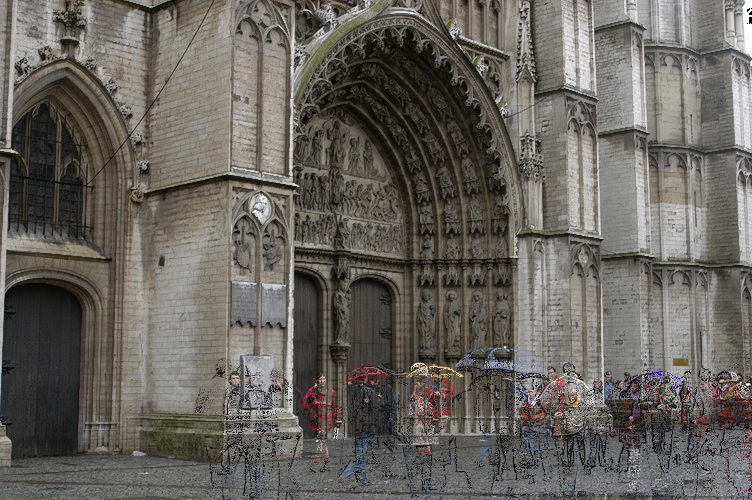

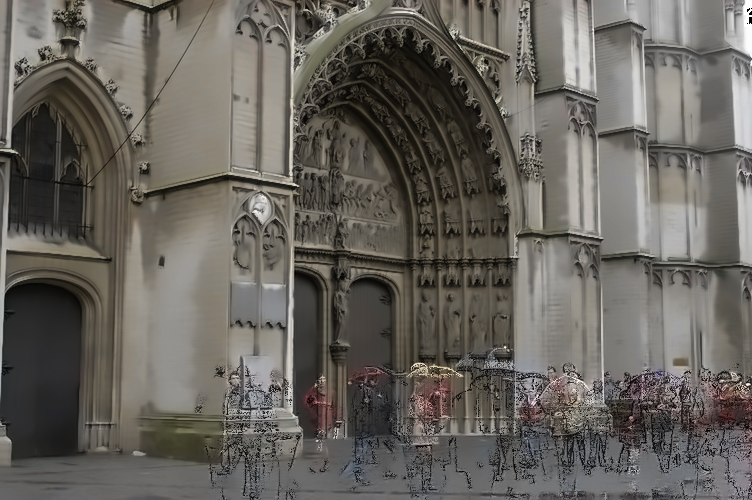

In [ ]:
backSub = cv2.createBackgroundSubtractorKNN()

g = np.array([
  [0, -1, 0],
  [-1, 4, -1],
  [0, -1, 0]
], np.float32)

def gamma(i, g):
  return i ** g

def detect_prec(img):
    img_grayscale = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) / 255.0
    img_edges = cv2.filter2D(img_grayscale, -1, g)
    # gamma correction
    return gamma(np.abs(img_edges), 3.5)

def merge(bugs, bugs_prec):
    bugs_prec = bugs_prec[:, :, :, np.newaxis]
    return np.sum(bugs_prec * bugs, 0) / np.sum(bugs_prec, 0)

for i in range(5):
  fgMask = backSub.apply(cathedral_imgs[i])
  backSub.apply(cathedral_imgs[i])

cathedral_prec = np.array(list(map(detect_prec, cathedral_imgs)))
cathedral_combined = merge(cathedral_imgs, cathedral_prec)
imshow(cathedral_combined)
dst = cv2.fastNlMeansDenoisingColored(cathedral_combined.astype("uint8"),None,10,10,7,21)
imshow(dst)

# Właściwe przetwarzanie
Pierwszym krokiem właściwego przetwarzania jest utworzenie maski. Służy ona do określenia miejsc, w których zdjęcia nie różnią się znacząco. Dobrany próg, dla którego określana jest maska został wybrany empirycznie. Wartości pikseli nieprzekraczające progu zostają wyliczone jako mediana zdjęć wejściowych.

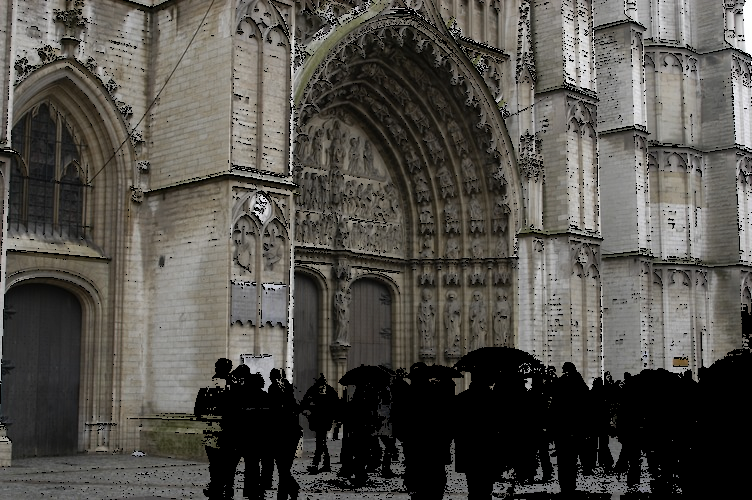

In [ ]:
cathedral_imgs_1 = np.moveaxis(cathedral_imgs, 0, -1)
output_img = np.zeros(cathedral_imgs_1.shape[:-1], dtype=np.uint8)

diff = cathedral_imgs_1.max(axis=-1) - cathedral_imgs_1.min(axis=-1)

threshold = 30
mask = diff <= threshold
# print(mask)
# print('------------------------------------')
mask = mask.all(axis=-1)
# print(mask)

output_img[mask] = np.median(cathedral_imgs_1[mask], axis=-1)
imshow(output_img)

# imshow(output_img)

W ramach kolejnego kroku przetwarzania dla obszarów z maską równą 1, obliczamy częstość występowania pikseli o danym kolorze, "spłaszczonym" do pierwiastka z oryginalnego rozmiaru przestrzeni kolorów. Dla sekwencji zdjęć wejściowych, pikel po pikselu wybieramy ten z największą częstością.

In [ ]:
def find_best_image(coords, images, density):
  pixels = images[coords[0], coords[1]].T // 16
  images_density = np.array([density[p[0], p[1], p[2]] for p in pixels])
  best_pixel = images[coords[0], coords[1], ..., images_density.argmax(axis=-1)]
  return best_pixel  

def max_frequency_pixels(images, output_img, mask):
  density = np.zeros((17, 17, 17), dtype=np.uint32)
  mask_output = output_img[mask == 1].reshape(-1, 3) // 16
  for m in mask_output:
    density[m[0], m[1], m[2]] += 1

  indices = np.indices(output_img.shape[:2])
  indices = indices.reshape(2, -1).T

  new_output_img = np.apply_along_axis(find_best_image, 1, arr=indices, images=images, density=density)

  return new_output_img.reshape(output_img.shape)


  

Kolejną funkcją służącą do dalszej obróbki naszych dotychczasowych rezultatów jest funkcja wykorzystująca określoną liczbę sąsiednich pikseli z oryginalnych obrazów dla obszarów z maską równą 0, w celu wyboru piksela z obrazu, który jest w tym obszarze najbardziej podobny do naszego obecnego wyniku. Podobieństwo może być określone na dwa sposoby minimalizujące: liczbę pikseli różniących się powyżej pewien próg albo sumę wartości bezwzględnych tych różnic. Daje to efekt wygładzenia szumu powstałego w poprzednim etapie.

In [ ]:
def find_image_with_min_diff(coords, images, output_img, n_neighbors, threshold, count_or_sum='sum'):
  neighborhood = np.arange(n_neighbors) - n_neighbors // 2
  x = np.repeat(neighborhood + coords[0], n_neighbors) % images.shape[0]
  y = np.tile(neighborhood + coords[1], n_neighbors) % images.shape[1]

  image_pixels = images[x, y].reshape(-1, 3, 5).astype(np.int16)
  output_pixels = np.repeat(output_img[x, y], 5, axis=-1).reshape(-1, 3, 5).astype(np.int16)

  diff = np.abs(image_pixels - output_pixels) > threshold if count_or_sum == 'count' else np.abs(image_pixels - output_pixels)
  diff = diff.reshape(-1, 5)
  diff = np.sum(diff, axis=0)

  best_pixel = images[coords[0], coords[1], ..., diff.argmin(axis=-1)]
  return best_pixel

def smoothing(images, output_img, mask, n_neighbors, threshold, count_or_sum='sum'):
  indices = np.vstack(np.where(mask == 0)).T
  new_output_img = np.apply_along_axis(find_image_with_min_diff, 1, indices, images, output_img, n_neighbors, threshold, count_or_sum)
  new_output_img = np.squeeze(new_output_img)

  output_img[mask == 0] = new_output_img

  return output_img



Końcowe przetwarzanie wykorzystuje na przemian funkcję wyboru najczęstszych pikseli oraz wygładzania szumu (bazując na liczbie "błędów"). Parametrem różniącym się w kolejnych etapach jest liczba sąsiadów. Wartości tego parametru zostały dobrane empirycznie, aby uzyskać jak najlepszy rezultat. Ostateczny wynik otrzymujemy minimalizując sumę różnic podczas wygładzania wcześniej otrzymanego obrazu. 

Number of neighbors: 3
Image after pixel selection by their frequency


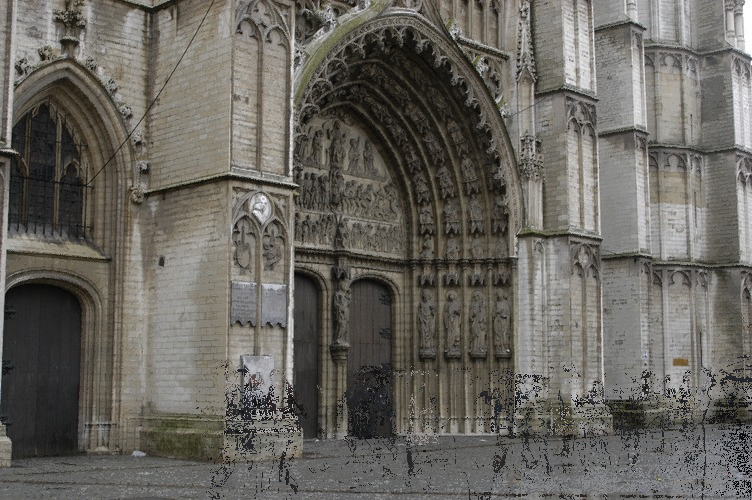

After smoothing by pixels from neighborhood


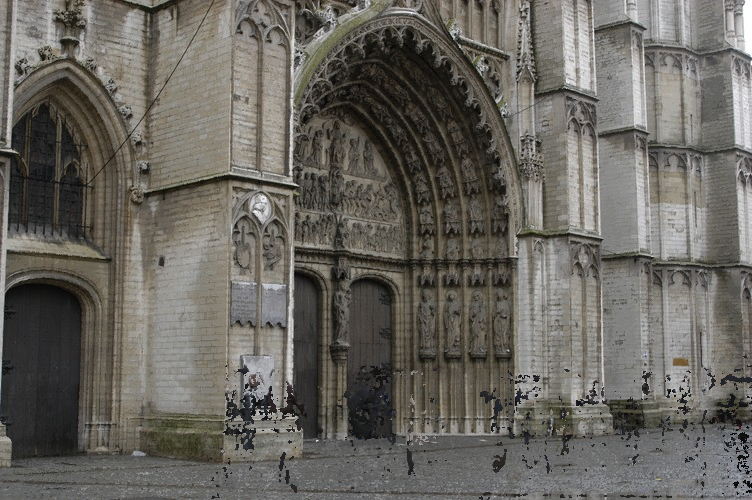

Number of neighbors: 5
Image after pixel selection by their frequency


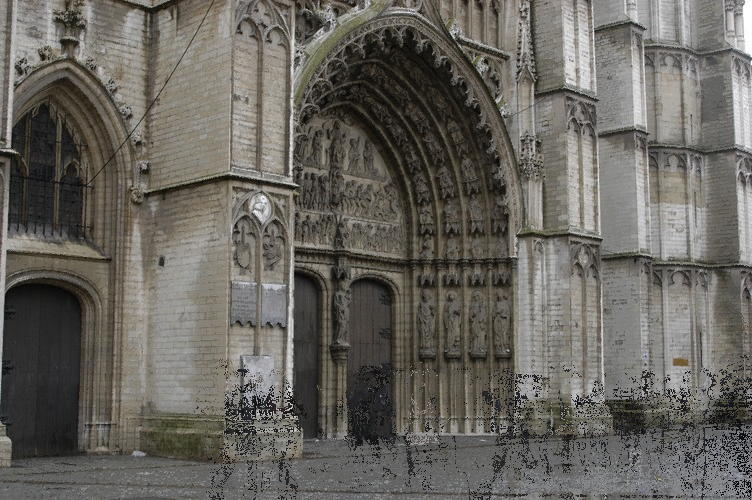

After smoothing by pixels from neighborhood


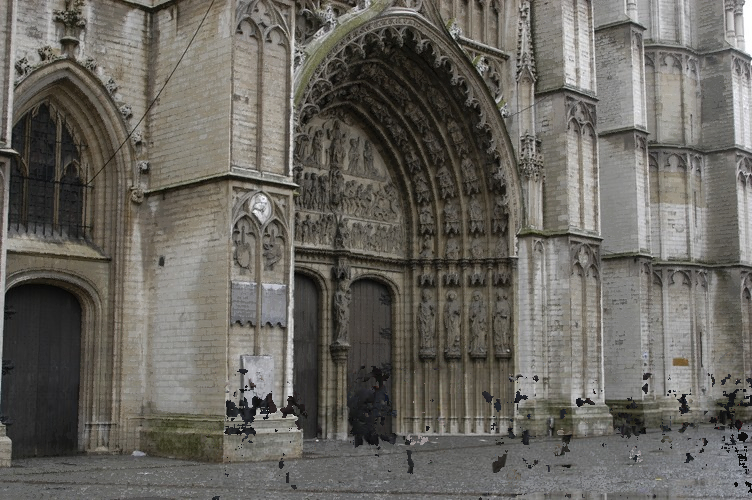

Number of neighbors: 15
Image after pixel selection by their frequency


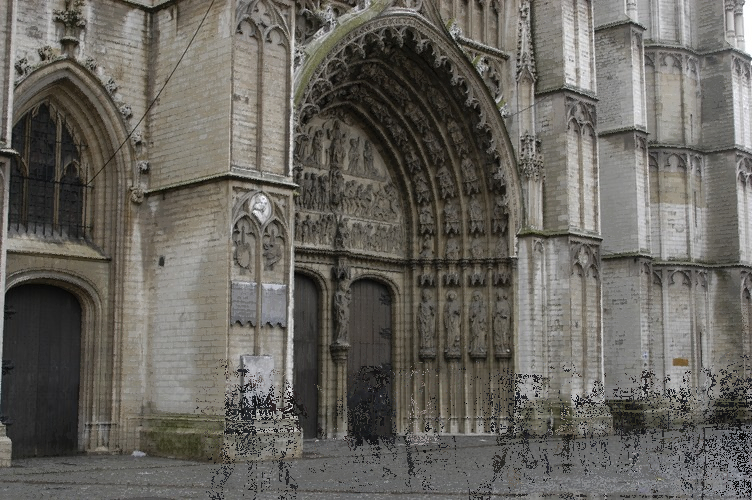

After smoothing by pixels from neighborhood


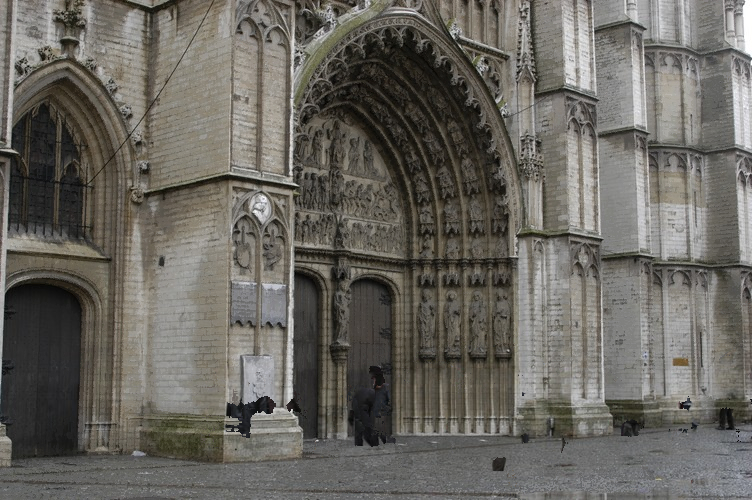

Number of neighbors: 25
Image after pixel selection by their frequency


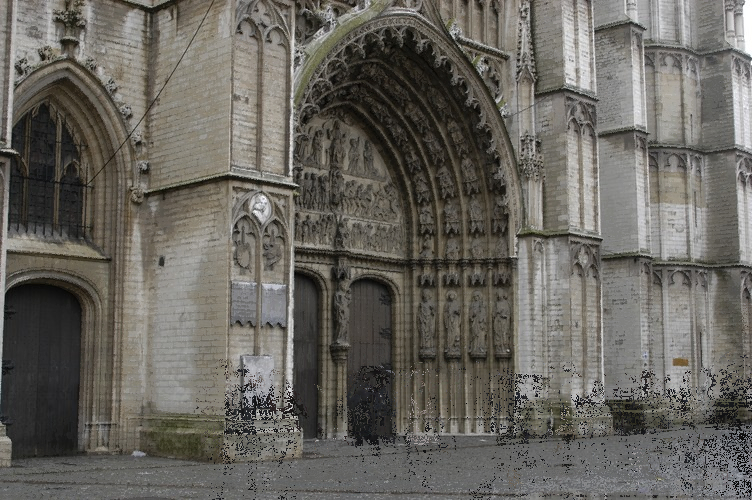

After smoothing by pixels from neighborhood


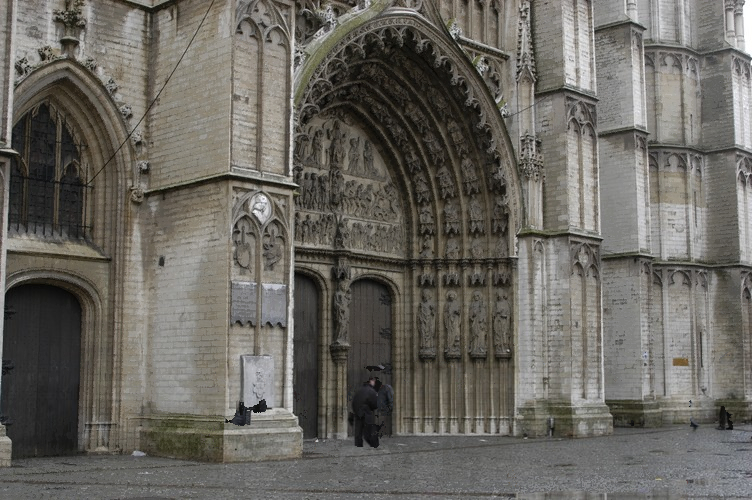

In [ ]:
mask_1 = deepcopy(mask)
final_output_img = deepcopy(output_img)

neighbors_list = [3, 5, 15, 25]

for n in neighbors_list:
  print('Number of neighbors:', n)
  final_output_img = max_frequency_pixels(cathedral_imgs_1, final_output_img, mask_1)
  print('Image after pixel selection by their frequency')
  imshow(final_output_img)

  final_output_img = smoothing(cathedral_imgs_1, final_output_img, mask, n, 20, 'count')
  print('After smoothing by pixels from neighborhood')
  imshow(final_output_img)
  mask_1 = np.ones_like(mask_1)


final_img = smoothing(cathedral_imgs_1, final_output_img, mask, 60, 40, 'sum')

# Porównanie ostatecznego rezultatu do najlepszego zamieszczonego w pobranym zbiorze
Otrzymany wynik jest zbliżony do wzorcowego. Zawiera drobny artefakt w prawym dolnym rogu wynikający z dużego zagęszczenia ludzi w tym obszarze na obrazach wejściowych. W obu rezultatach widoczna jest niedoskonałość na bramie katedry, spowodowana przez podobny kolor kurtki przechodnia.

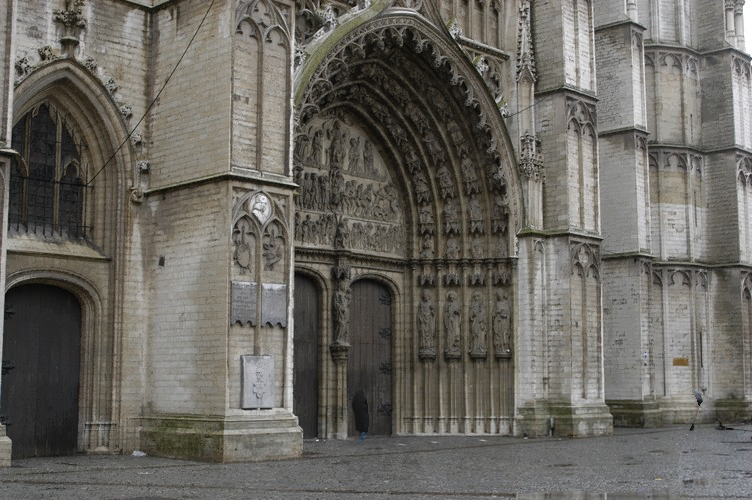

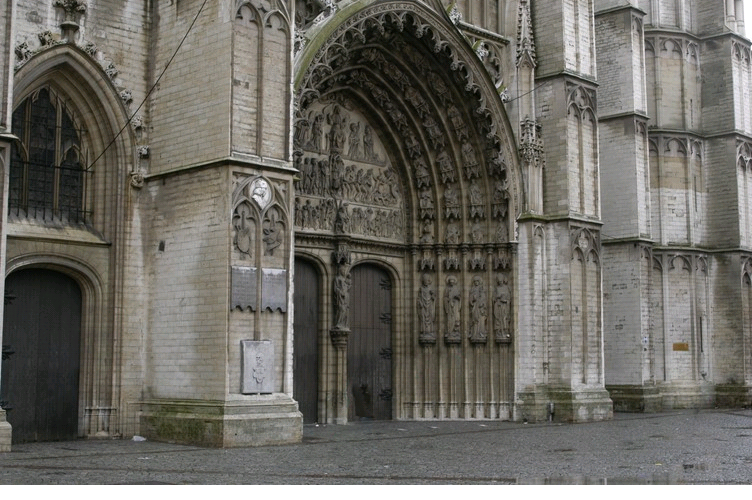

In [ ]:
imshow(final_img)
imshow(result_img)